In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline 


In [4]:
data = pd.read_csv(r"C:\Users\ahmad\Downloads\term-deposit-marketing-2020.csv")
data.head(3)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,no


In [5]:
data.describe()

,age,balance,day,duration,campaign
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,40.544600,1274.277550,16.017225,254.824300,2.882175
std,9.641776,2903.769716,8.278127,259.366498,3.239051
min,19.000000,-8019.000000,1.000000,0.000000,1.000000
25%,33.000000,54.000000,8.000000,100.000000,1.000000
50%,39.000000,407.000000,17.000000,175.000000,2.000000
75%,48.000000,1319.000000,21.000000,313.000000,3.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000


In [6]:
categorical = ['job','marital','education','default','housing','loan','contact']
X = pd.get_dummies(data.iloc[:,:-1],columns=categorical,drop_first=True)
y = data['y']


In [7]:
months = {'jan':1,'feb':2,'mar':3,'apr':4,'may':5,'jun':6,'jul':7,'aug':8,'sep':9,'oct':10,'nov':11,'dec':12}
labels = {'yes':1,'no':0}
X.month = X.month.replace(months)
y = y.replace(labels)

In [8]:
X

,age,balance,day,month,duration,campaign,job_blue-collar,job_entrepreneur,job_housemaid,job_management,...,marital_married,marital_single,education_secondary,education_tertiary,education_unknown,default_yes,housing_yes,loan_yes,contact_telephone,contact_unknown
0,58,2143,5,5,261,1,0,0,0,1,...,1,0,0,1,0,0,1,0,0,1
1,44,29,5,5,151,1,0,0,0,0,...,0,1,1,0,0,0,1,0,0,1
2,33,2,5,5,76,1,0,1,0,0,...,1,0,1,0,0,0,1,1,0,1
3,47,1506,5,5,92,1,1,0,0,0,...,1,0,0,0,1,0,1,0,0,1
4,33,1,5,5,198,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,53,395,3,6,107,1,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
39996,30,3340,3,6,238,3,0,0,0,1,...,0,1,0,1,0,0,0,0,0,0
39997,54,200,3,6,170,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
39998,34,1047,3,6,342,1,0,0,0,1,...,1,0,0,1,0,0,0,0,0,0


In [9]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [10]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 100, random_state = 1)


In [11]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(rf, X, y, cv=5)

In [12]:
np.average(scores)

0.645675

In [13]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 3000, num = 15)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [14]:
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000, 2200, 2400, 2600, 2800, 3000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [15]:
from sklearn.model_selection import RandomizedSearchCV
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, 
                               n_iter = 100, cv = 5, verbose=2, random_state=1, n_jobs = -1)
rf_random.fit(X, y)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 492.9min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 556.1min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 589.1min finished


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000, 2200, 2400,
                                                         2600, 2800, 3000]},
                   random_state=1, verbose=2)

In [16]:
rf_random.best_params_

{'n_estimators': 2400,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 10,
 'bootstrap': True}

In [20]:
best_rf = RandomForestClassifier(**rf_random.best_params_,random_state = 1)
scores = cross_val_score(best_rf, X, y, cv=5)
np.average(scores)

0.7164250000000001

In [21]:
scores

array([0.92775 , 0.874   , 0.88475 , 0.135   , 0.760625])

In [34]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

pipe = make_pipeline(StandardScaler(),
                     RandomForestClassifier(**rf_random.best_params_,random_state = 1))
scores = cross_val_score(pipe, X, y, cv=5)
np.average(scores)

0.7164

In [37]:
from sklearn.decomposition import PCA

pca = PCA(.95)
pipe = make_pipeline(pca,StandardScaler(),
                     RandomForestClassifier(**rf_random.best_params_,random_state = 1))
scores = cross_val_score(pipe, X, y, cv=5)
np.average(scores)

0.9276

In [62]:
from sklearn.preprocessing import Normalizer, normalize

pca = PCA(.98)
pipe = make_pipeline(pca,StandardScaler(), Normalizer(norm='l2'),
                     RandomForestClassifier(**rf_random.best_params_,random_state = 1))
scores = cross_val_score(pipe, X, y, cv=5)
np.average(scores)

0.9276

In [43]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(random_state=1, max_iter=1000, alpha=1e-5,
                    hidden_layer_sizes=(729,27,10),activation="tanh",
                    verbose=True,shuffle=True,early_stopping=True,,validation_fraction=.2)

clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_test, y_pred)

Iteration 1, loss = 0.23653055
Validation score: 0.927188
Iteration 2, loss = 0.19950522
Validation score: 0.927188
Iteration 3, loss = 0.19648956
Validation score: 0.931250
Iteration 4, loss = 0.19667246
Validation score: 0.935000
Iteration 5, loss = 0.19721462
Validation score: 0.936250
Iteration 6, loss = 0.19399391
Validation score: 0.928438
Iteration 7, loss = 0.19516584
Validation score: 0.928438
Iteration 8, loss = 0.19549262
Validation score: 0.927500
Iteration 9, loss = 0.19235269
Validation score: 0.928750
Iteration 10, loss = 0.19290138
Validation score: 0.933438
Iteration 11, loss = 0.19457754
Validation score: 0.928750
Iteration 12, loss = 0.19187529
Validation score: 0.930000
Iteration 13, loss = 0.19273067
Validation score: 0.928750
Iteration 14, loss = 0.18969410
Validation score: 0.934375
Iteration 15, loss = 0.19182504
Validation score: 0.934375
Iteration 16, loss = 0.19198432
Validation score: 0.930312
Validation score did not improve more than tol=0.000100 for 10 co

0.928875

In [54]:
mlp = MLPClassifier(random_state=1, max_iter=1000, alpha=1e-5,
                    hidden_layer_sizes=(729,27,10),activation="tanh",
                    verbose=True,shuffle=True,early_stopping=True,validation_fraction=.2)

pipe = make_pipeline(pca,StandardScaler(), Normalizer(norm='l2'),mlp)
scores = cross_val_score(pipe, X, y, cv=5)
np.average(scores)

0.9276

Text(0.5, 0, 'Random Forest Feature Importance')

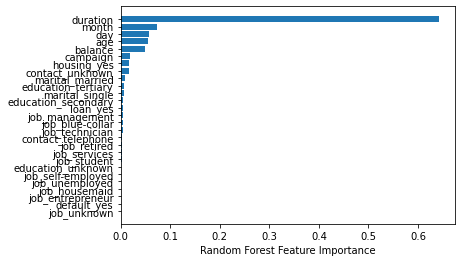

In [56]:
best_ref_clf= best_rf.fit(X_train,y_train)
sorted_idx = best_ref_clf.feature_importances_.argsort()
plt.barh(X.columns[sorted_idx], best_ref_clf.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

Text(0.5, 0, 'Permutation Importance')

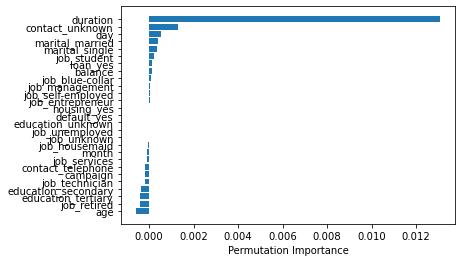

In [60]:
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(best_ref_clf, X_test, y_test)
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(X.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

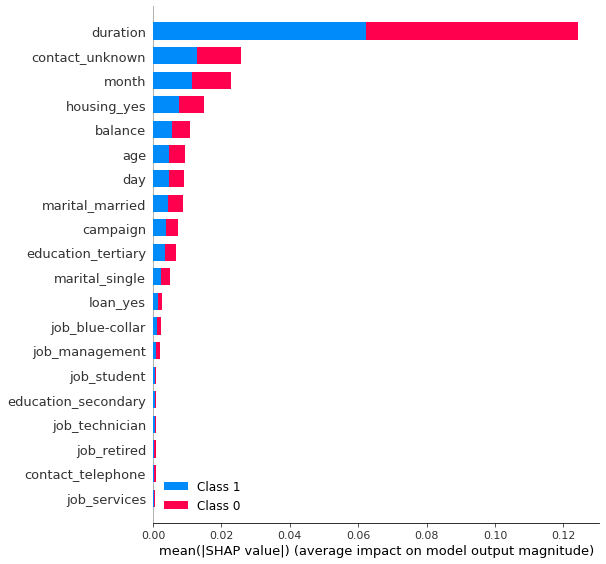

In [61]:
import shap
explainer = shap.TreeExplainer(best_ref_clf)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar")

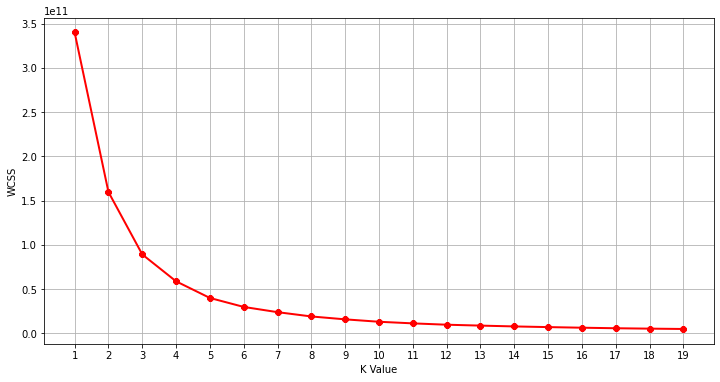

In [71]:
from sklearn.cluster import KMeans
wcss = []
for k in range(1,20):
    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.grid()
plt.plot(range(1,20),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,20,1))
plt.ylabel("WCSS")
plt.show()

In [103]:
bestK = KMeans(n_clusters=2, init="k-means++")
bestK.fit(X)

KMeans(n_clusters=2)

In [104]:
X['K'] = bestK.labels_

In [105]:
X.K.value_counts()

1    38354
0     1646
Name: K, dtype: int64

In [112]:
from sklearn import metrics 
from scipy.spatial.distance import cdist 

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,20) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(X) 
    kmeanModel.fit(X)     
      
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / X.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / X.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 


In [113]:

for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 


1 : 1512.8275402138167
2 : 1096.8728773541807
3 : 850.3489127653394
4 : 755.208799842661
5 : 633.472472069904
6 : 546.8290795966055
7 : 468.3867019084727
8 : 450.0466240056402
9 : 408.4708650479567
10 : 406.66612169306774
11 : 368.6772692803566
12 : 348.63708227205586
13 : 325.836060198297
14 : 304.6600216971549
15 : 296.57403797779705
16 : 284.1076691859439
17 : 272.0109809000271
18 : 268.5527372776818
19 : 261.2247081882634


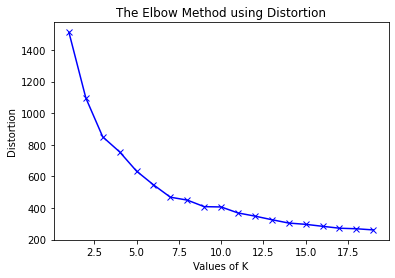

In [114]:

plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 


In [115]:

for key,val in mapping2.items(): 
    print(str(key)+' : '+str(val)) 


1 : 339964668838.92035
2 : 159710173330.51797
3 : 89214751884.99577
4 : 58826635353.84733
5 : 40033780086.73231
6 : 29907521953.88946
7 : 23990330726.832222
8 : 19260566507.359276
9 : 15874601031.453592
10 : 13149214109.065348
11 : 11334470598.13737
12 : 9818520792.56264
13 : 8808375008.47035
14 : 7879237957.996758
15 : 7105196003.589642
16 : 6437012064.814912
17 : 5958574974.5650625
18 : 5434971686.928151
19 : 4991068738.262708


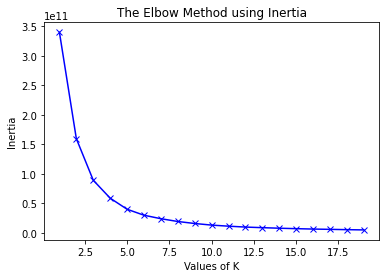

In [117]:

plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show() 


In [118]:
bestK = KMeans(n_clusters=7).fit(X)
X['K'] = bestK.labels_

In [156]:
import seaborn as sns 
from mpl_toolkits.mplot3d import Axes3D

pcas = PCA(n_components=2).fit(X)
v = pcas.transform(X)
v = pd.DataFrame(v)
v['K'] = bestK.labels_


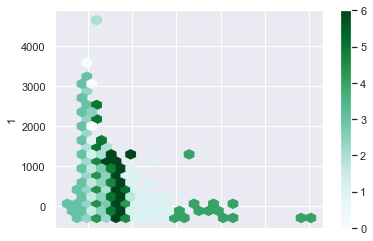

In [170]:
v.plot(kind='hexbin',x=0,y=1,C='K',gridsize=25);


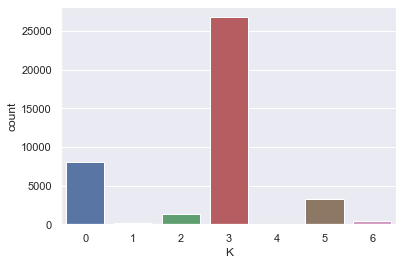

In [177]:
sns.countplot(v['K']);

In [186]:
import plotly.express as px
data['Cluster'] = bestK.labels_
fig = px.parallel_categories(data.drop(['campaign','day'],axis=1))
fig.show()